In [1]:
import librosa
import os


In [2]:
# Directories for healthy individuals and individuals with Parkinson's
healthy_dir = 'C:/Users/info/Downloads/Data4/healthy/'
parkinson_dir = 'C:/Users/info/Downloads/Data4/parkinson/'

# Function to load all audio files from a directory
def load_all_audio_files(directory):
    audio_files = []
    sampling_rates = []
    for file in os.listdir(directory):
        if file.endswith('.wav'):  # Adjust extension if different
            file_path = os.path.join(directory, file)
            audio, sr = librosa.load(file_path)
            audio_files.append(audio)
            sampling_rates.append(sr)
    return audio_files, sampling_rates

# Load all audio files for healthy individuals
healthy_audio, sr_healthy = load_all_audio_files(healthy_dir)

# Load all audio files for individuals with Parkinson's
parkinson_audio, sr_parkinson = load_all_audio_files(parkinson_dir)


In [3]:
print(type(healthy_audio), type(sr_healthy))
print(type(parkinson_audio), type(sr_parkinson))


<class 'list'> <class 'list'>
<class 'list'> <class 'list'>


In [4]:
print("Number of audio files for healthy individuals:", len(healthy_audio))
print("Number of sampling rates for healthy individuals:", len(sr_healthy))


Number of audio files for healthy individuals: 170
Number of sampling rates for healthy individuals: 170


In [5]:
print("Number of audio files for individuals with Parkinson's:", len(parkinson_audio))
print("Number of sampling rates for individuals with Parkinson's:", len(sr_parkinson))


Number of audio files for individuals with Parkinson's: 211
Number of sampling rates for individuals with Parkinson's: 211


In [6]:
from IPython.display import Audio

# Play the first audio file from the healthy individuals list
Audio(healthy_audio[0], rate=sr_healthy[0])


In [7]:
from IPython.display import Audio

# Play the first audio file from the healthy individuals list
Audio(parkinson_audio[0], rate=sr_parkinson[0])

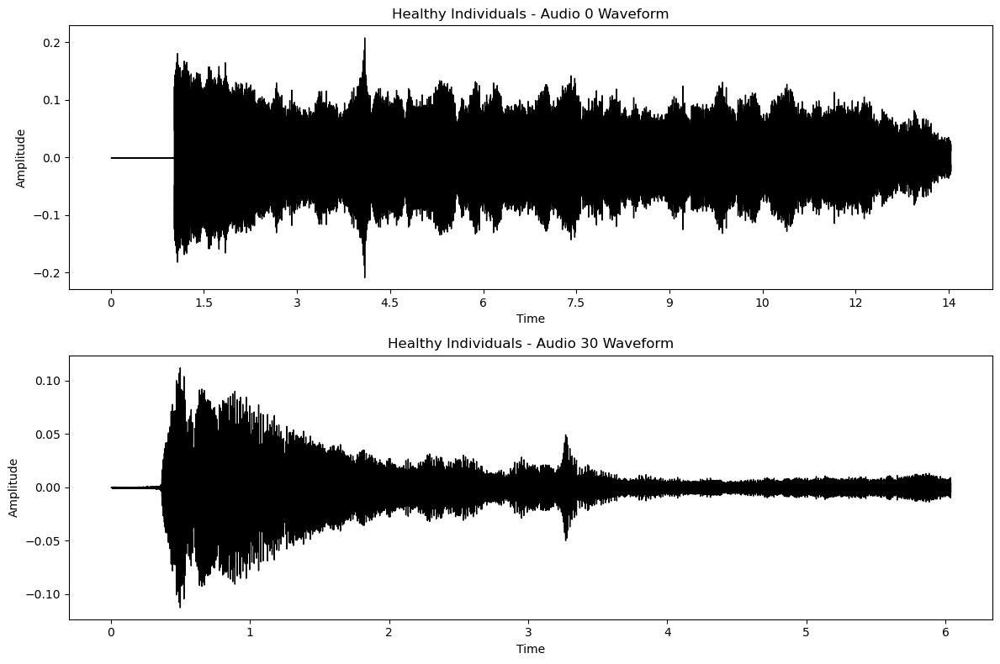

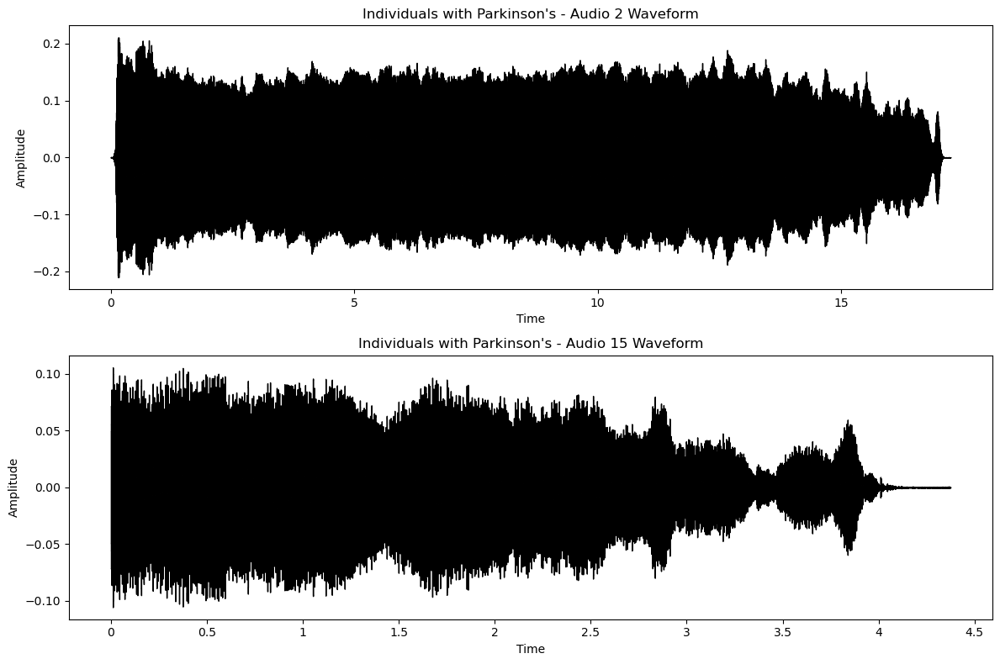

In [8]:
import matplotlib.pyplot as plt
import librosa.display

# Function to plot waveforms for specific indices in a list of audio files
def plot_selected_waveforms(audio_list, sr_list, indices, title):
    num_plots = len(indices)
    plt.figure(figsize=(12, 4 * num_plots))
    for i, idx in enumerate(indices):
        plt.subplot(num_plots, 1, i + 1)
        librosa.display.waveshow(audio_list[idx], sr=sr_list[idx], color='black')
        plt.title(f'{title} - Audio {idx} Waveform')
        plt.xlabel('Time')
        plt.ylabel('Amplitude')
    plt.tight_layout()
    plt.show()

# Indices of the selected audio files from each list
selected_indices_healthy = [0, 30]  # Replace with indices of healthy individuals' audio files
selected_indices_parkinson = [2, 15]  # Replace with indices of Parkinson's individuals' audio files

# Plot waveforms for selected examples from healthy individuals
plot_selected_waveforms(healthy_audio, sr_healthy, selected_indices_healthy, 'Healthy Individuals')

# Plot waveforms for selected examples from individuals with Parkinson's
plot_selected_waveforms(parkinson_audio, sr_parkinson, selected_indices_parkinson, "Individuals with Parkinson's")


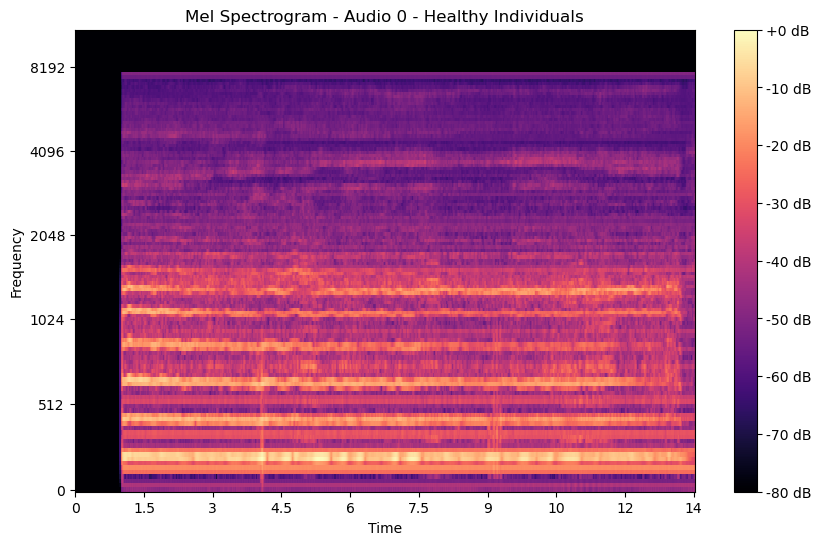

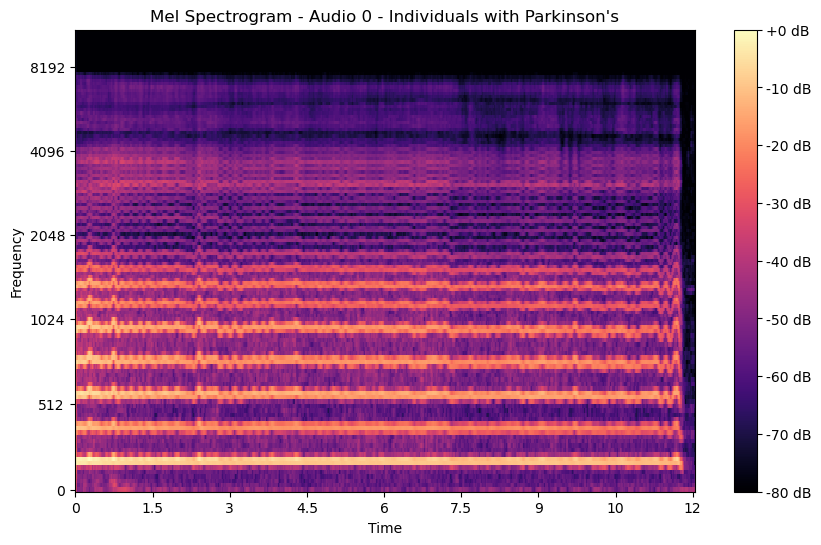

In [9]:
import matplotlib.pyplot as plt
import librosa.display
import numpy as np 

# Function to plot spectrogram for a specific index in a list of audio files
def plot_spectrogram_for_index(audio_list, sr_list, index, title):
    # Check if the index is within the range of the list
    if 0 <= index < len(audio_list):
        audio = audio_list[index]
        sr = sr_list[index]

        # Generate a spectrogram
        spectrogram = librosa.feature.melspectrogram(y=audio, sr=sr)

        # Convert to decibels for better visualization
        log_spectrogram = librosa.power_to_db(spectrogram, ref=np.max)

        # Plot the spectrogram
        plt.figure(figsize=(10, 6))
        librosa.display.specshow(log_spectrogram, sr=sr, x_axis='time', y_axis='mel')
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Mel Spectrogram - Audio {index} - {title}')
        plt.xlabel('Time')
        plt.ylabel('Frequency')
        plt.show()
    else:
        print("Index out of range.")

# Choose the index of the audio file you want to visualize
index_to_visualize = 0  # Replace with the desired index

# Plot the spectrogram for the selected index from healthy individuals
plot_spectrogram_for_index(healthy_audio, sr_healthy, index_to_visualize, 'Healthy Individuals')

# Plot the spectrogram for the selected index from individuals with Parkinson's
plot_spectrogram_for_index(parkinson_audio, sr_parkinson, index_to_visualize, "Individuals with Parkinson's")


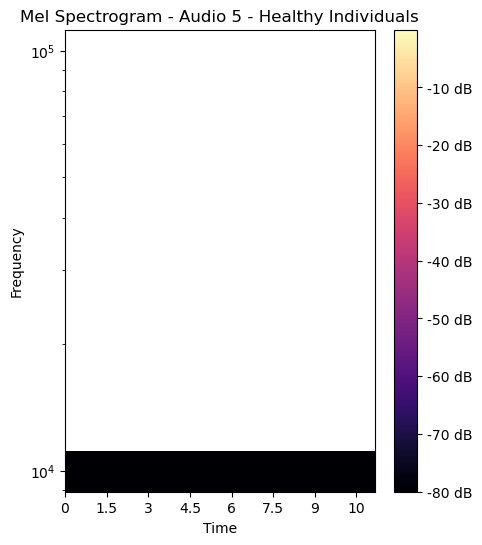

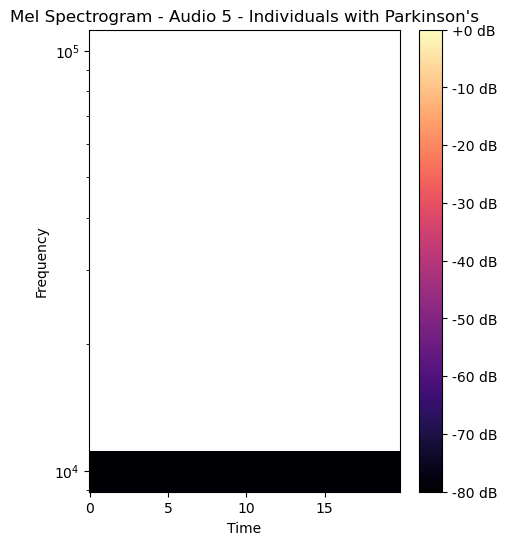

In [10]:
import matplotlib.pyplot as plt
import librosa.display
import numpy as np 

# Function to plot spectrogram for a specific index in a list of audio files
def plot_spectrogram_for_index(audio_list, sr_list, index, title):
    # Check if the index is within the range of the list
    if 0 <= index < len(audio_list):
        audio = audio_list[index]
        sr = sr_list[index]

        # Generate a spectrogram
        spectrogram = librosa.feature.melspectrogram(y=audio, sr=sr)

        # Convert to decibels for better visualization
        log_spectrogram = librosa.power_to_db(spectrogram, ref=np.max)

        # Plot the spectrogram
        plt.figure(figsize=(5, 6))
        librosa.display.specshow(log_spectrogram, sr=sr, x_axis='time', y_axis='mel')
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Mel Spectrogram - Audio {index} - {title}')
        plt.xlabel('Time')
        plt.ylabel('Frequency')
        plt.yscale('log')  # Set y-axis scale to logarithmic
        plt.show()
    else:
        print("Index out of range.")

# Choose the index of the audio file you want to visualize
index_to_visualize = 5  # Replace with the desired index

# Plot the spectrogram for the selected index from healthy individuals
plot_spectrogram_for_index(healthy_audio, sr_healthy, index_to_visualize, 'Healthy Individuals')

# Plot the spectrogram for the selected index from individuals with Parkinson's
plot_spectrogram_for_index(parkinson_audio, sr_parkinson, index_to_visualize, "Individuals with Parkinson's")


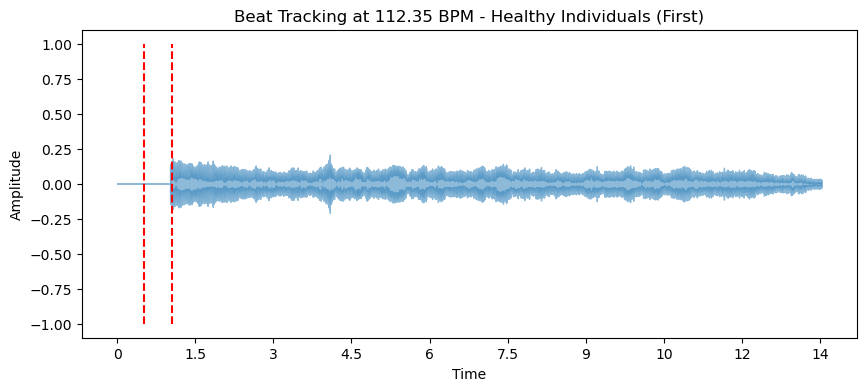

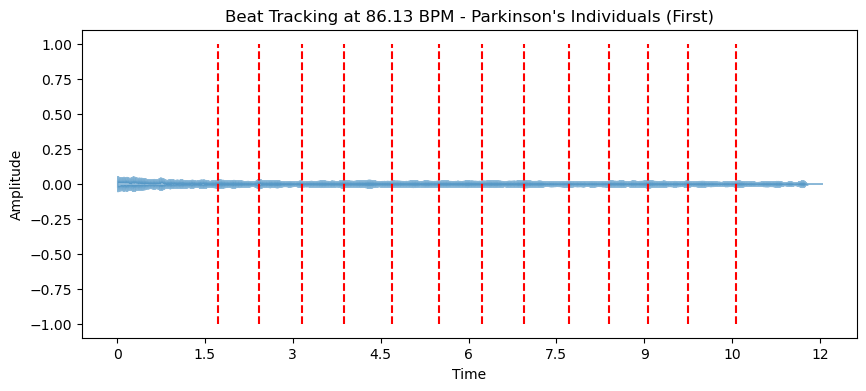

In [11]:
import librosa
import matplotlib.pyplot as plt

# Function for beat tracking and visualization
def beat_tracking_and_visualization(audio_list, sr_list, title):
    if len(audio_list) > 0:
        # Extract the first audio file and its sampling rate from the list
        y = audio_list[0]
        sr = sr_list[0]

        # Calculate tempo and beats
        tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)

        # Convert beat frames to times
        beat_times = librosa.frames_to_time(beat_frames, sr=sr)

        # Plot waveform and beat markers
        plt.figure(figsize=(10, 4))
        librosa.display.waveshow(y, sr=sr, alpha=0.5)
        plt.vlines(beat_times, ymin=-1, ymax=1, color='r', linestyle='--')
        plt.title(f'Beat Tracking at {tempo:.2f} BPM - {title}')
        plt.xlabel('Time')
        plt.ylabel('Amplitude')
        plt.show()
    else:
        print("No audio files in the list.")

# Perform beat tracking for the first audio file from the healthy individuals list
beat_tracking_and_visualization(healthy_audio, sr_healthy, 'Healthy Individuals (First)')

# Perform beat tracking for the first audio file from the Parkinson's individuals list
beat_tracking_and_visualization(parkinson_audio, sr_parkinson, "Parkinson's Individuals (First)")


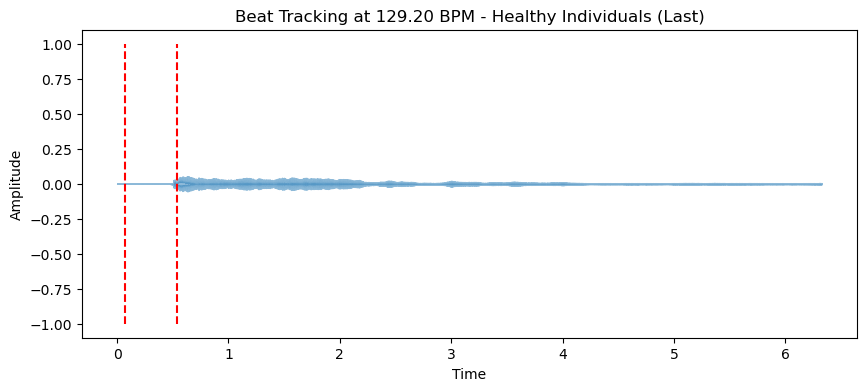

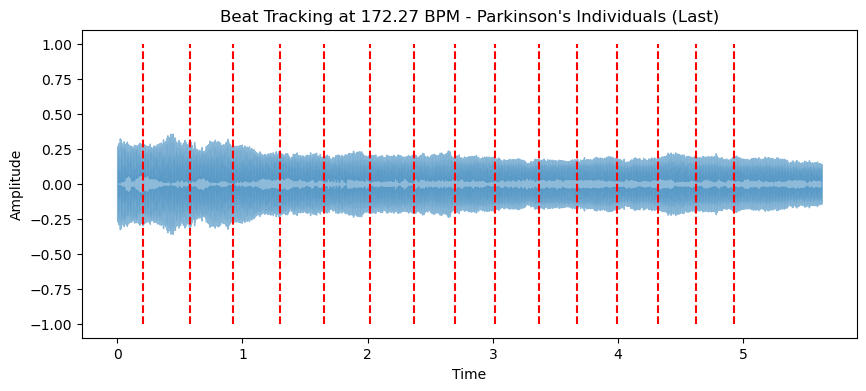

In [12]:
import librosa
import matplotlib.pyplot as plt

# Function for beat tracking and visualization
def beat_tracking_and_visualization(audio_list, sr_list, title):
    if len(audio_list) > 0:
        # Extract the last audio file and its sampling rate from the list
        y = audio_list[-1]
        sr = sr_list[-1]

        # Calculate tempo and beats
        tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)

        # Convert beat frames to times
        beat_times = librosa.frames_to_time(beat_frames, sr=sr)

        # Plot waveform and beat markers
        plt.figure(figsize=(10, 4))
        librosa.display.waveshow(y, sr=sr, alpha=0.5)
        plt.vlines(beat_times, ymin=-1, ymax=1, color='r', linestyle='--')
        plt.title(f'Beat Tracking at {tempo:.2f} BPM - {title}')
        plt.xlabel('Time')
        plt.ylabel('Amplitude')
        plt.show()
    else:
        print("No audio files in the list.")

# Perform beat tracking for the last audio file from the healthy individuals list
beat_tracking_and_visualization(healthy_audio, sr_healthy, 'Healthy Individuals (Last)')

# Perform beat tracking for the last audio file from the Parkinson's individuals list
beat_tracking_and_visualization(parkinson_audio, sr_parkinson, "Parkinson's Individuals (Last)")


# Preprocessing 

Normalization: Ensuring all audio signals have consistent amplitudes. This step involves scaling the audio to a standard range to prevent issues caused by varying signal strengths.

In [13]:
import librosa

# Function to normalize audio list
def normalize_audio_list(audio_list):
    normalized_audio_list = []
    for audio in audio_list:
        normalized_audio = librosa.util.normalize(audio)
        normalized_audio_list.append(normalized_audio)
    return normalized_audio_list

# Normalize audio for healthy individuals
normalized_healthy_audio = normalize_audio_list(healthy_audio)

# Normalize audio for individuals with Parkinson's
normalized_parkinson_audio = normalize_audio_list(parkinson_audio)

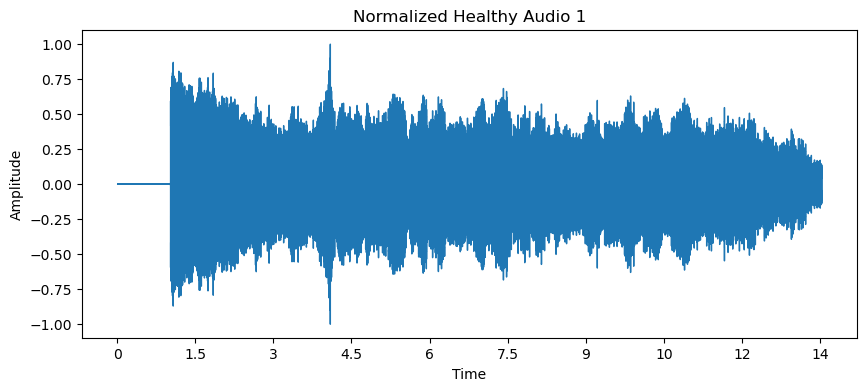

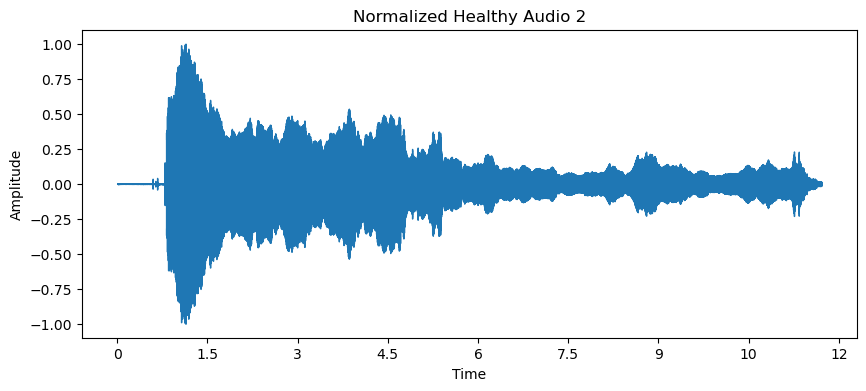

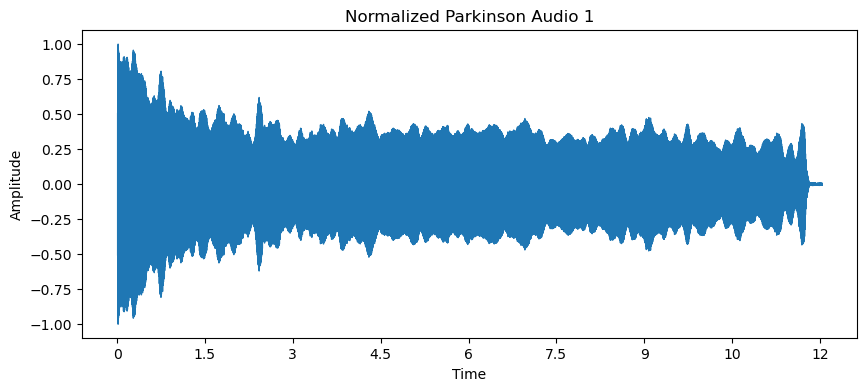

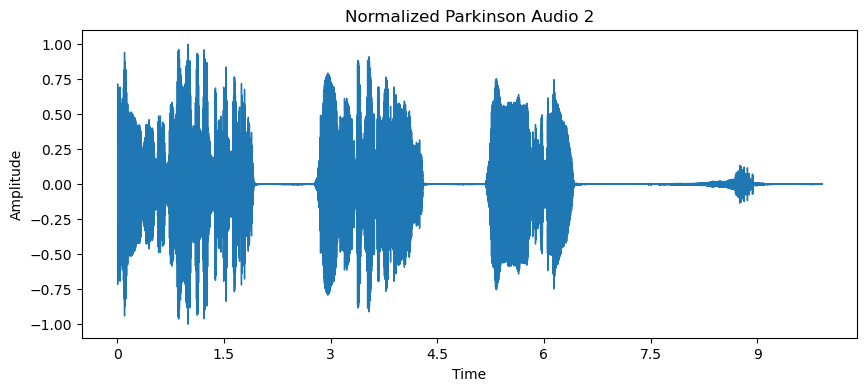

In [14]:
import matplotlib.pyplot as plt
import librosa.display

# Function to plot waveform for a given audio file
def plot_waveform(audio, title):
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(audio)
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.show()

# Plotting waveforms for normalized audio of healthy individuals
for i, audio in enumerate(normalized_healthy_audio[:2]):
    plot_waveform(audio, f'Normalized Healthy Audio {i+1}')

# Plotting waveforms for normalized audio of individuals with Parkinson's
for i, audio in enumerate(normalized_parkinson_audio[:2]):
    plot_waveform(audio, f'Normalized Parkinson Audio {i+1}')

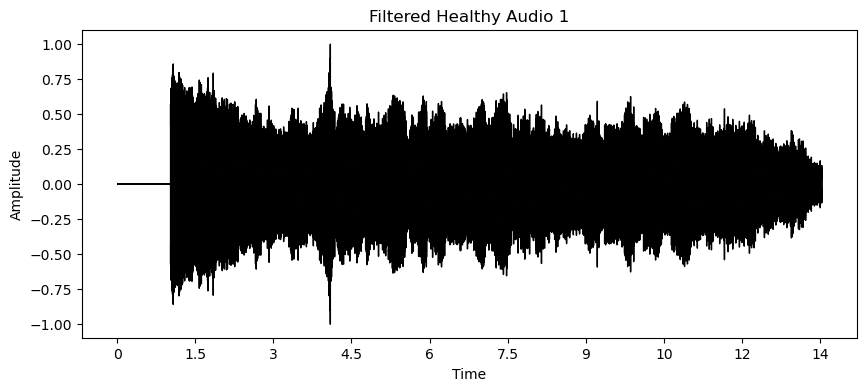

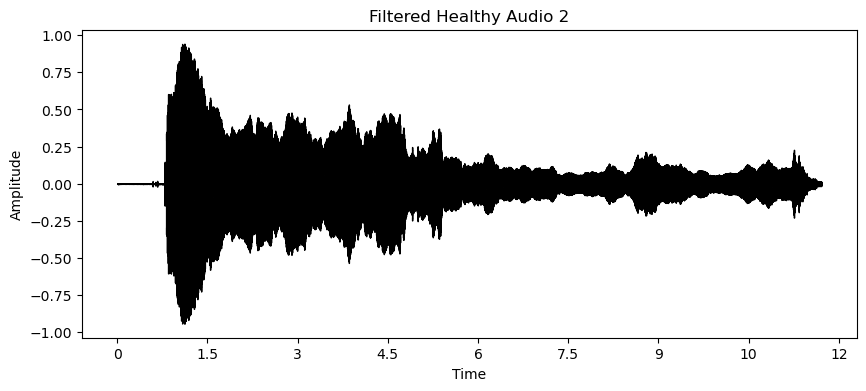

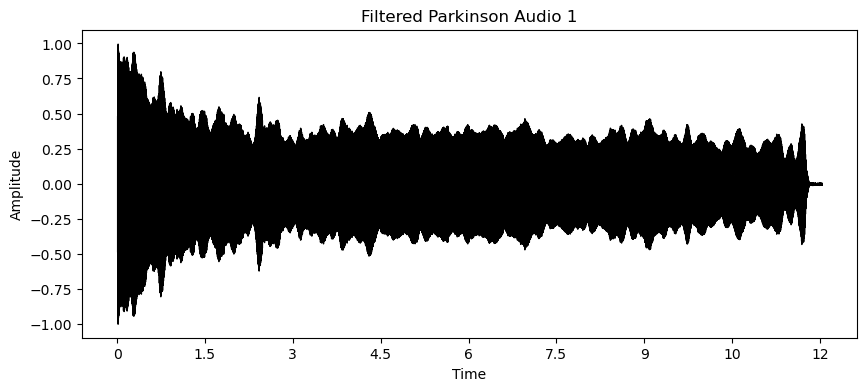

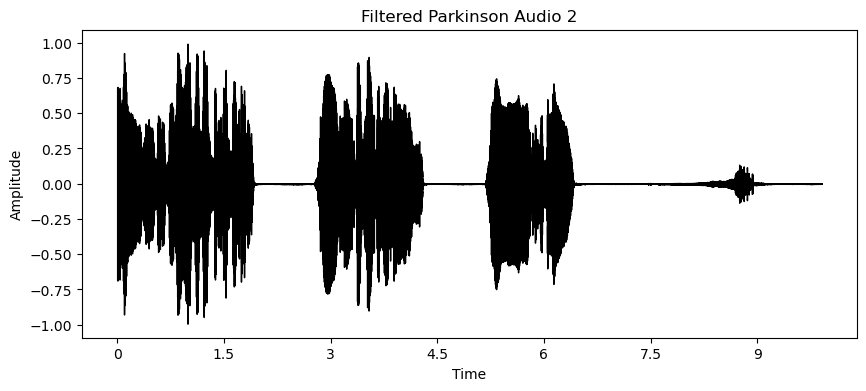

In [15]:
from scipy.signal import medfilt
import librosa
import matplotlib.pyplot as plt

# Function for noise reduction using median filtering
def reduce_noise(audio_list):
    filtered_audio_list = []
    for audio in audio_list:
        # Applying median filtering to reduce noise
        filtered_audio = medfilt(audio, kernel_size=3)  # Adjust kernel size as needed
        filtered_audio_list.append(filtered_audio)
    return filtered_audio_list

# Applying noise reduction to healthy audio
filtered_healthy_audio = reduce_noise(normalized_healthy_audio)

# Applying noise reduction to Parkinson's audio
filtered_parkinson_audio = reduce_noise(normalized_parkinson_audio)

# Function to plot waveform for filtered audio
def plot_waveform(audio, title):
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(audio, color='black')  # Setting color to black
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.show()

# Plotting waveforms for the first two filtered audio of healthy individuals
for i, audio in enumerate(filtered_healthy_audio[:2]):
    plot_waveform(audio, f'Filtered Healthy Audio {i+1}')

# Plotting waveforms for the first two filtered audio of individuals with Parkinson's
for i, audio in enumerate(filtered_parkinson_audio[:2]):
    plot_waveform(audio, f'Filtered Parkinson Audio {i+1}')

**Extract features** 

In [16]:
def extract_audio_features(audio_list, sr_list):
    features = []
    for audio, sr in zip(audio_list, sr_list):
        # MFCC
        mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)
        mfcc_mean = np.mean(mfcc, axis=1)
        
        # Chroma feature
        chroma = librosa.feature.chroma_stft(y=audio, sr=sr)
        chroma_mean = np.mean(chroma, axis=1)
        
        # Spectral Centroid
        centroid = librosa.feature.spectral_centroid(y=audio, sr=sr)
        centroid_mean = np.mean(centroid)
        
        # Zero Crossing Rate
        zcr = librosa.feature.zero_crossing_rate(y=audio)
        zcr_mean = np.mean(zcr)
        
        # Spectral Contrast
        contrast = librosa.feature.spectral_contrast(y=audio, sr=sr)
        contrast_mean = np.mean(contrast, axis=1)

        # Spectral Rolloff
        rolloff = librosa.feature.spectral_rolloff(y=audio, sr=sr)
        rolloff_mean = np.mean(rolloff)

        # Tonnetz
        tonnetz = librosa.feature.tonnetz(y=audio, sr=sr)
        tonnetz_mean = np.mean(tonnetz, axis=1)

        # Pitch
        pitch, _ = librosa.piptrack(y=audio, sr=sr)
        pitch_mean = np.mean(pitch)

        # Jitter
        jitter = librosa.effects.harmonic(audio)
        jitter_mean = np.mean(jitter)

        # Append all features for this audio
        features.append(list(mfcc_mean) + list(chroma_mean) + [centroid_mean, zcr_mean, rolloff_mean] + list(tonnetz_mean) + list(contrast_mean) + [pitch_mean, jitter_mean])
    
    return features

# Extract multiple audio features for healthy individuals
all_features_healthy = extract_audio_features(filtered_healthy_audio, sr_healthy)

# Example: Displaying the first set of features for a healthy individual
print("Features for the first healthy individual:", all_features_healthy[0])


Features for the first healthy individual: [-164.52151, 116.97624, -12.652682, -5.033879, -12.450485, 14.168046, 0.23934633, -11.23847, -14.051349, -0.4806093, -0.85282606, -5.2354894, -9.200924, 0.15633477, 0.14156748, 0.13459367, 0.46323997, 0.41872185, 0.115458444, 0.093579456, 0.2147416, 0.92580426, 0.70824164, 0.14736584, 0.10788084, 1585.9178370554991, 0.056058540147941684, 2801.5879191010936, 0.2955825529971112, -0.07411834022162923, -0.2712571710175604, 0.11352404005630583, -0.04868015393761358, 0.08909446513240336, 28.471065418135915, 24.318156017444853, 22.63354376140819, 20.836296134430448, 18.45770384621213, 18.616334618721485, 17.971208246532992, 19.582838, 1.3484168e-06]


In [17]:
import pandas as pd 
# Create a list of column names for the features
column_names = [f'MFCC_{i+1}' for i in range(13)] + \
               [f'Chroma_{i+1}' for i in range(12)] + \
               ['Spectral_Centroid', 'Zero_Crossing_Rate', 'Spectral_Rolloff'] + \
               [f'Tonnetz_{i+1}' for i in range(6)] + \
               [f'Spectral_Contrast_{i+1}' for i in range(7)] + \
               ['Pitch', 'Jitter']

# Create a DataFrame from the extracted features for healthy individuals
df_healthy_features = pd.DataFrame(all_features_healthy, columns=column_names)

# Add a "Status" column with the value 0 to indicate the person is healthy
df_healthy_features['Status'] = 0

# Display the first few rows of the DataFrame
print(df_healthy_features.head())

# Save the extracted data to a CSV file
df_healthy_features.to_csv('healthy_individuals_features.csv', index=False)

       MFCC_1      MFCC_2     MFCC_3     MFCC_4     MFCC_5     MFCC_6  \
0 -164.521515  116.976242 -12.652682  -5.033879 -12.450485  14.168046   
1 -281.078278   81.349358 -68.494942 -36.323139 -25.434973  -0.197469   
2 -294.474487  134.268005 -13.586844  -1.309030 -26.365202  -6.247060   
3 -267.068451   82.485992  -6.367494 -13.767311 -46.202995 -14.294512   
4 -328.319031   80.129601 -51.956192 -22.458508 -22.180538 -15.985027   

      MFCC_7     MFCC_8     MFCC_9    MFCC_10  ...  Spectral_Contrast_1  \
0   0.239346 -11.238470 -14.051349  -0.480609  ...            28.471065   
1  29.330242 -17.552483 -26.313583  -2.462273  ...            16.544259   
2 -11.306576 -20.294647 -37.932068 -22.224701  ...            29.883323   
3   5.276790   0.847943 -21.527454   5.079780  ...            18.774672   
4  15.106588  -0.421345 -30.216511 -23.910385  ...            28.505592   

   Spectral_Contrast_2  Spectral_Contrast_3  Spectral_Contrast_4  \
0            24.318156            22.63354

In [18]:
def extract_audio_features_parkinson(audio_list, sr_list):
    features = []
    for audio, sr in zip(audio_list, sr_list):
        # MFCC
        mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)
        mfcc_mean = np.mean(mfcc, axis=1)
        
        # Chroma feature
        chroma = librosa.feature.chroma_stft(y=audio, sr=sr)
        chroma_mean = np.mean(chroma, axis=1)
        
        # Spectral Centroid
        centroid = librosa.feature.spectral_centroid(y=audio, sr=sr)
        centroid_mean = np.mean(centroid)
        
        # Zero Crossing Rate
        zcr = librosa.feature.zero_crossing_rate(y=audio)
        zcr_mean = np.mean(zcr)
        
        # Spectral Contrast
        contrast = librosa.feature.spectral_contrast(y=audio, sr=sr)
        contrast_mean = np.mean(contrast, axis=1)

        # Spectral Rolloff
        rolloff = librosa.feature.spectral_rolloff(y=audio, sr=sr)
        rolloff_mean = np.mean(rolloff)

        # Tonnetz
        tonnetz = librosa.feature.tonnetz(y=audio, sr=sr)
        tonnetz_mean = np.mean(tonnetz, axis=1)

        # Pitch
        pitch, _ = librosa.piptrack(y=audio, sr=sr)
        pitch_mean = np.mean(pitch)

        # Jitter
        jitter = librosa.effects.harmonic(audio)
        jitter_mean = np.mean(jitter)

        # Append all features for this audio
        features.append(list(mfcc_mean) + list(chroma_mean) + [centroid_mean, zcr_mean, rolloff_mean] + list(tonnetz_mean) + list(contrast_mean) + [pitch_mean, jitter_mean])
    
    return features

# Extract multiple audio features for individuals with Parkinson's
all_features_parkinson = extract_audio_features_parkinson(filtered_parkinson_audio, sr_parkinson)


In [19]:
import pandas as pd 
# Create a list of column names for the features
column_names = [f'MFCC_{i+1}' for i in range(13)] + \
               [f'Chroma_{i+1}' for i in range(12)] + \
               ['Spectral_Centroid', 'Zero_Crossing_Rate', 'Spectral_Rolloff'] + \
               [f'Tonnetz_{i+1}' for i in range(6)] + \
               [f'Spectral_Contrast_{i+1}' for i in range(7)] + \
               ['Pitch', 'Jitter']

# Create a DataFrame from the extracted features for individuals with Parkinson's
df_parkinson_features = pd.DataFrame(all_features_parkinson, columns=column_names)

# Add a "Status" column with the value 1 to indicate the person has Parkinson's
df_parkinson_features['Status'] = 1

# Display the first few rows of the DataFrame
print(df_parkinson_features.head())

# Save the extracted data to a CSV file
df_parkinson_features.to_csv('parkinson_individuals_features.csv', index=False)

       MFCC_1      MFCC_2     MFCC_3     MFCC_4     MFCC_5     MFCC_6  \
0 -216.073914  111.972588 -25.807096  -3.633603 -29.638334   2.908501   
1 -348.503693   95.834862   2.721355   1.558158   6.195900   6.377907   
2 -149.609879  150.114990  -0.453125 -24.433844 -35.380814   1.420528   
3 -276.325226  102.702881 -57.239910 -75.544411 -16.647757  13.780258   
4 -257.831116  149.994797 -21.349924 -11.395025 -12.751929  -7.764378   

      MFCC_7     MFCC_8     MFCC_9    MFCC_10  ...  Spectral_Contrast_1  \
0  18.077915  -9.832480 -20.287493  10.060030  ...            28.667149   
1  -6.728680   7.591464   3.743576   1.073528  ...            19.246961   
2   0.799864  11.470648  16.871372 -24.567173  ...            30.622348   
3  12.942787  -2.689969  -9.179233  -3.531924  ...            20.623199   
4  10.549028  12.628339 -11.450993  -3.152862  ...            27.344109   

   Spectral_Contrast_2  Spectral_Contrast_3  Spectral_Contrast_4  \
0            29.267045            28.89495

In [20]:
# Vérifier le nombre de lignes dans le DataFrame extrait
nombre_de_lignes = df_parkinson_features.shape[0]
print(f"Il y a {nombre_de_lignes} lignes dans le DataFrame des caractéristiques des individus atteints de Parkinson.")


Il y a 211 lignes dans le DataFrame des caractéristiques des individus atteints de Parkinson.


In [21]:
import pandas as pd

# Charger les données extraites pour les individus en bonne santé
df_healthy = pd.read_csv('healthy_individuals_features.csv')

# Charger les données extraites pour les individus atteints de Parkinson
df_parkinson = pd.read_csv('parkinson_individuals_features.csv')

# Concaténer les deux DataFrames
combined_df = pd.concat([df_healthy, df_parkinson], ignore_index=True)

# Enregistrer le DataFrame combiné dans un fichier CSV
combined_df.to_csv('parkinson_dataset.csv', index=False)


In [22]:
import pandas as pd

# Load the CSV file
parkinson_dataset = pd.read_csv('parkinson_dataset.csv')

# View the first few rows
parkinson_dataset.head()


,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,MFCC_10,...,Spectral_Contrast_1,Spectral_Contrast_2,Spectral_Contrast_3,Spectral_Contrast_4,Spectral_Contrast_5,Spectral_Contrast_6,Spectral_Contrast_7,Pitch,Jitter,Status
0,-164.52151,116.97624,-12.652682,-5.033879,-12.450485,14.168046,0.239346,-11.238470,-14.051349,-0.480609,...,28.471065,24.318156,22.633544,20.836296,18.457704,18.616335,17.971208,19.582838,0.000001,0
1,-281.07828,81.34936,-68.494940,-36.323140,-25.434973,-0.197469,29.330242,-17.552483,-26.313583,-2.462273,...,16.544259,23.400071,28.243488,25.808918,25.222682,25.267186,15.385684,22.019087,-0.000003,0
2,-294.47450,134.26800,-13.586844,-1.309030,-26.365202,-6.247060,-11.306576,-20.294647,-37.932068,-22.224700,...,29.883323,23.337536,26.176419,22.499901,18.189403,18.478773,15.680165,15.278666,-0.000035,0
3,-267.06845,82.48599,-6.367494,-13.767311,-46.202995,-14.294512,5.276790,0.847943,-21.527454,5.079780,...,18.774672,23.373688,26.785699,25.937457,23.340529,19.887519,17.463897,9.205094,-0.000002,0
4,-328.31903,80.12960,-51.956192,-22.458508,-22.180538,-15.985027,15.106588,-0.421345,-30.216510,-23.910385,...,28.505592,26.106777,27.074065,23.480377,22.964711,20.789774,14.498344,19.953050,-0.000010,0


In [23]:
parkinson_dataset.tail()

,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,MFCC_10,...,Spectral_Contrast_1,Spectral_Contrast_2,Spectral_Contrast_3,Spectral_Contrast_4,Spectral_Contrast_5,Spectral_Contrast_6,Spectral_Contrast_7,Pitch,Jitter,Status
376,-295.77670,118.581160,44.855373,20.619800,-38.192810,-8.010204,-3.888120,6.573439,11.105448,-19.845833,...,31.709605,24.569457,23.252850,27.733657,19.071268,18.590570,16.901447,1.498607,-6.614725e-07,1
377,-231.23065,168.348660,24.558937,23.305914,-44.271904,-52.886665,3.592442,2.455614,-15.138500,14.121659,...,32.916226,25.632255,25.644041,34.832578,22.561091,25.921236,15.398630,3.055813,2.573898e-05,1
378,-247.62398,178.192660,25.719212,36.810238,-18.598482,-42.923473,-6.932858,12.735596,-3.134820,-8.311936,...,28.077499,24.877751,27.198519,32.824549,22.883462,23.613389,14.421451,2.690377,9.469254e-06,1
379,-347.23538,107.036415,14.080896,15.061060,-23.294077,-20.750063,-9.001121,-5.855825,-6.797846,-18.424864,...,15.151042,29.189260,27.883801,29.267183,23.632769,25.213611,16.812325,2.135290,-3.702769e-06,1
380,-251.39027,187.880840,33.569550,14.402434,-33.815266,-28.260416,0.389340,11.055697,-4.256374,-14.695786,...,34.593470,20.705194,22.824687,29.629765,18.431014,18.514801,16.543008,2.208022,1.256502e-05,1


In [24]:

# Mélanger les lignes du DataFrame
full_dataset_shuffled = parkinson_dataset.sample(frac=1).reset_index(drop=True)

# Enregistrer le DataFrame mélangé dans un fichier CSV
full_dataset_shuffled.to_csv('parkinson_dataset_shuffled.csv', index=False)


In [25]:
import pandas as pd

# Load the CSV file
parkinson_dataset = pd.read_csv('parkinson_dataset_shuffled.csv')

# View the first few rows
parkinson_dataset.head()


,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,MFCC_10,...,Spectral_Contrast_1,Spectral_Contrast_2,Spectral_Contrast_3,Spectral_Contrast_4,Spectral_Contrast_5,Spectral_Contrast_6,Spectral_Contrast_7,Pitch,Jitter,Status
0,-303.57227,170.799000,65.393740,15.831965,-53.338116,-12.948759,0.361939,3.701031,4.939376,-1.838002,...,30.120292,19.914815,21.446903,30.183292,18.470219,18.926341,16.712788,2.947712,-0.000004,1
1,-341.86087,121.419690,24.242025,-10.447879,-34.153435,-34.143410,-17.686602,-15.444049,-27.011541,-22.220348,...,34.700790,27.452239,29.795464,24.954010,17.571986,18.847509,15.420007,4.236906,-0.000027,0
2,-256.14923,71.293236,-2.339371,31.476390,-3.158180,-16.739872,12.845612,-8.122198,-12.545116,-22.344349,...,21.253673,22.193711,26.816600,27.576182,28.071179,25.692025,17.690954,10.187729,-0.000005,1
3,-313.98413,89.958400,33.207810,78.929550,8.147924,-31.263927,-2.835724,-12.422996,-47.373123,-21.256042,...,32.828785,20.922624,22.607515,14.361172,21.660049,21.120904,15.838520,8.319562,-0.000004,0
4,-250.77122,73.364760,-1.682626,-6.557806,-42.160400,-10.914100,5.429477,-1.303906,-19.501238,5.460862,...,17.768838,23.504655,26.958975,24.318966,23.846975,19.773826,17.544863,8.154662,0.000001,0


In [26]:
parkinson_dataset.tail()

,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,MFCC_10,...,Spectral_Contrast_1,Spectral_Contrast_2,Spectral_Contrast_3,Spectral_Contrast_4,Spectral_Contrast_5,Spectral_Contrast_6,Spectral_Contrast_7,Pitch,Jitter,Status
376,-268.21677,83.51764,11.481396,41.971240,4.400095,-43.657085,-28.800926,5.658619,-21.792831,-12.076575,...,21.427882,20.712032,28.043621,25.691850,21.774997,20.914590,16.520822,5.803388,-0.000048,0
377,-267.06845,82.48599,-6.367494,-13.767311,-46.202995,-14.294512,5.276790,0.847943,-21.527454,5.079780,...,18.774672,23.373688,26.785699,25.937457,23.340529,19.887519,17.463897,9.205094,-0.000002,0
378,-276.32523,102.70288,-57.239910,-75.544410,-16.647757,13.780258,12.942787,-2.689969,-9.179233,-3.531924,...,20.623199,20.996910,28.773326,25.386842,28.951342,18.007396,14.737234,10.350085,-0.000002,1
379,-219.61950,167.65518,12.418983,1.465052,-23.081917,-53.095722,-12.634117,13.523432,1.592424,3.330983,...,30.127263,27.311543,27.135017,33.783560,23.033637,22.215393,16.997643,3.557298,-0.000013,1
380,-180.69835,71.82180,-25.194400,32.615760,12.613524,-36.888493,-25.814090,-11.228368,1.373437,-12.547572,...,15.785311,30.589277,31.786650,27.992350,27.336196,24.289384,16.404630,7.089847,-0.000007,1


# Data Preprocessing


---
 The following steps are performed on the dataset in this section:
 + Dropping Redudant Columns
 + Checking For Duplicated Rows
 + Checking For Missing Values

In [27]:
print('Number of Features In Dataset :', parkinson_dataset.shape[1])
print('Number of Instances In Dataset : ', parkinson_dataset.shape[0])

Number of Features In Dataset : 44
Number of Instances In Dataset :  381


In [28]:
# Exploring Information About Dataframe
parkinson_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381 entries, 0 to 380
Data columns (total 44 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   MFCC_1               381 non-null    float64
 1   MFCC_2               381 non-null    float64
 2   MFCC_3               381 non-null    float64
 3   MFCC_4               381 non-null    float64
 4   MFCC_5               381 non-null    float64
 5   MFCC_6               381 non-null    float64
 6   MFCC_7               381 non-null    float64
 7   MFCC_8               381 non-null    float64
 8   MFCC_9               381 non-null    float64
 9   MFCC_10              381 non-null    float64
 10  MFCC_11              381 non-null    float64
 11  MFCC_12              381 non-null    float64
 12  MFCC_13              381 non-null    float64
 13  Chroma_1             381 non-null    float64
 14  Chroma_2             381 non-null    float64
 15  Chroma_3             381 non-null    flo

In [29]:
parkinson_dataset.describe()

,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,MFCC_10,...,Spectral_Contrast_1,Spectral_Contrast_2,Spectral_Contrast_3,Spectral_Contrast_4,Spectral_Contrast_5,Spectral_Contrast_6,Spectral_Contrast_7,Pitch,Jitter,Status
count,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,...,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000
mean,-255.192530,105.496069,5.949371,21.865065,-6.889780,-16.186625,-10.637473,-5.682914,-10.415142,-10.859055,...,28.141807,24.933828,26.479937,23.044493,22.197230,20.446938,15.988597,7.644844,-0.000013,0.553806
std,65.629716,37.294405,25.726940,33.022822,30.358398,19.232145,20.110130,13.169337,13.612410,13.493002,...,5.395954,3.445571,3.963974,5.051396,3.148855,2.474827,1.392038,7.717454,0.000058,0.497750
min,-404.063720,21.000841,-68.494940,-75.544410,-91.668990,-66.629860,-62.436848,-49.422325,-52.782160,-48.311863,...,12.532241,15.540198,16.323729,13.293915,14.143608,15.906821,13.597756,0.403720,-0.000424,0.000000
25%,-303.684570,79.321610,-11.506248,-2.521530,-30.112940,-28.869392,-25.190182,-14.897501,-19.775187,-19.902403,...,26.878707,22.637758,23.399180,19.452677,19.854802,18.514801,14.814514,2.379879,-0.000021,0.000000
50%,-256.490630,107.423110,7.275609,22.222124,-3.208232,-15.756081,-8.910080,-4.603148,-9.855509,-10.481968,...,29.451547,25.146449,26.641959,22.378584,22.209525,20.055253,15.799373,4.948797,-0.000003,1.000000
75%,-212.499450,132.276860,24.242025,45.753178,15.357390,-2.131725,3.592442,4.160355,-0.724947,-2.111306,...,31.815655,27.418303,29.227503,26.417459,24.139675,22.178035,16.964847,9.947380,0.000005,1.000000
max,-76.539246,206.046750,71.279030,97.661560,67.326645,27.871202,39.695100,28.033792,23.921103,26.925749,...,36.231702,33.230544,38.131225,36.116098,30.388111,28.497831,20.339399,39.095090,0.000214,1.000000


In [30]:
# Checking For Duplicate Rows In Dataset
print('Number of Duplicated Rows :',parkinson_dataset.duplicated().sum())

Number of Duplicated Rows : 0


As observed in the above step, the dataset does **NOT** contain any Duplicated Rows.

In [31]:
# Checking For Missing Values In Dataset
parkinson_dataset.isna().sum()

MFCC_1                 0
MFCC_2                 0
MFCC_3                 0
MFCC_4                 0
MFCC_5                 0
MFCC_6                 0
MFCC_7                 0
MFCC_8                 0
MFCC_9                 0
MFCC_10                0
MFCC_11                0
MFCC_12                0
MFCC_13                0
Chroma_1               0
Chroma_2               0
Chroma_3               0
Chroma_4               0
Chroma_5               0
Chroma_6               0
Chroma_7               0
Chroma_8               0
Chroma_9               0
Chroma_10              0
Chroma_11              0
Chroma_12              0
Spectral_Centroid      0
Zero_Crossing_Rate     0
Spectral_Rolloff       0
Tonnetz_1              0
Tonnetz_2              0
Tonnetz_3              0
Tonnetz_4              0
Tonnetz_5              0
Tonnetz_6              0
Spectral_Contrast_1    0
Spectral_Contrast_2    0
Spectral_Contrast_3    0
Spectral_Contrast_4    0
Spectral_Contrast_5    0
Spectral_Contrast_6    0


As seen in the above step, **No Columns** of the dataset contains any Missing Values.

# Data Visualization

In [32]:
# distribution of our target variable i.e. "Status" column/feature
parkinson_dataset["Status"].value_counts()

1    211
0    170
Name: Status, dtype: int64

<Axes: xlabel='Status', ylabel='count'>

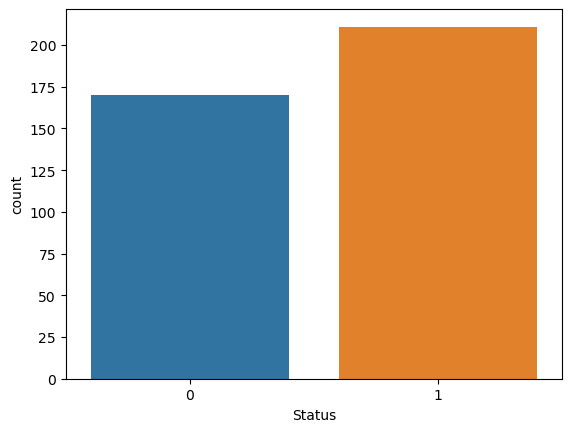

In [33]:
#Balance of Data
import seaborn as sns
sns.countplot(x='Status',data=parkinson_dataset)

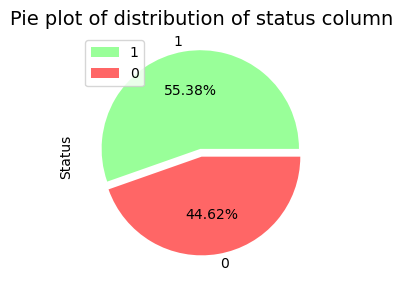

In [34]:
explode=(0.08,0)

parkinson_dataset['Status'].value_counts().plot.pie(autopct='%1.2f%%',figsize=(3,3),explode=explode,colors=['#99ff99','#ff6666'])
plt.title("Pie plot of distribution of status column", fontsize=14)
plt.tight_layout()
plt.legend()
plt.show()

**1 ---> Peoples with Parkinsons disease**

**0 ---> Healthy peoples**

###### **Observations:**
- 55.38% peoples (i.e. 211 peoples out of 381 peoples) are those who have parkinson disease. While 44.62% peoples (i.e. 170 peoples out of 381 peoples) are those who don't have parkinsons disease
- Data seems imbalanced

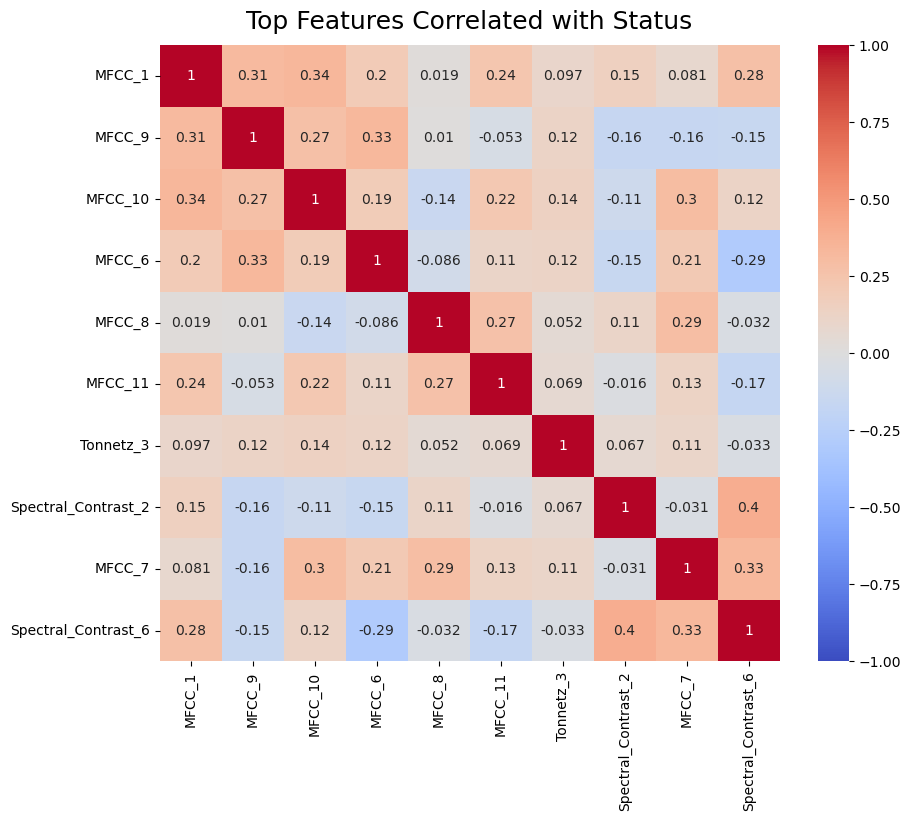

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix considering only numeric columns
corr_matrix = parkinson_dataset.corr(numeric_only=True)

# Filter the correlation matrix for 'Status' column
status_corr = corr_matrix['Status'].sort_values(ascending=False)

# Select the top features correlated with 'Status' (excluding 'Status' itself)
top_features = status_corr.index[status_corr.index != 'Status'][:10]

# Create a heatmap of top correlated features with 'Status'
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(parkinson_dataset[top_features].corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
heatmap.set_title('Top Features Correlated with Status', fontdict={'fontsize': 18}, pad=12)
plt.show()

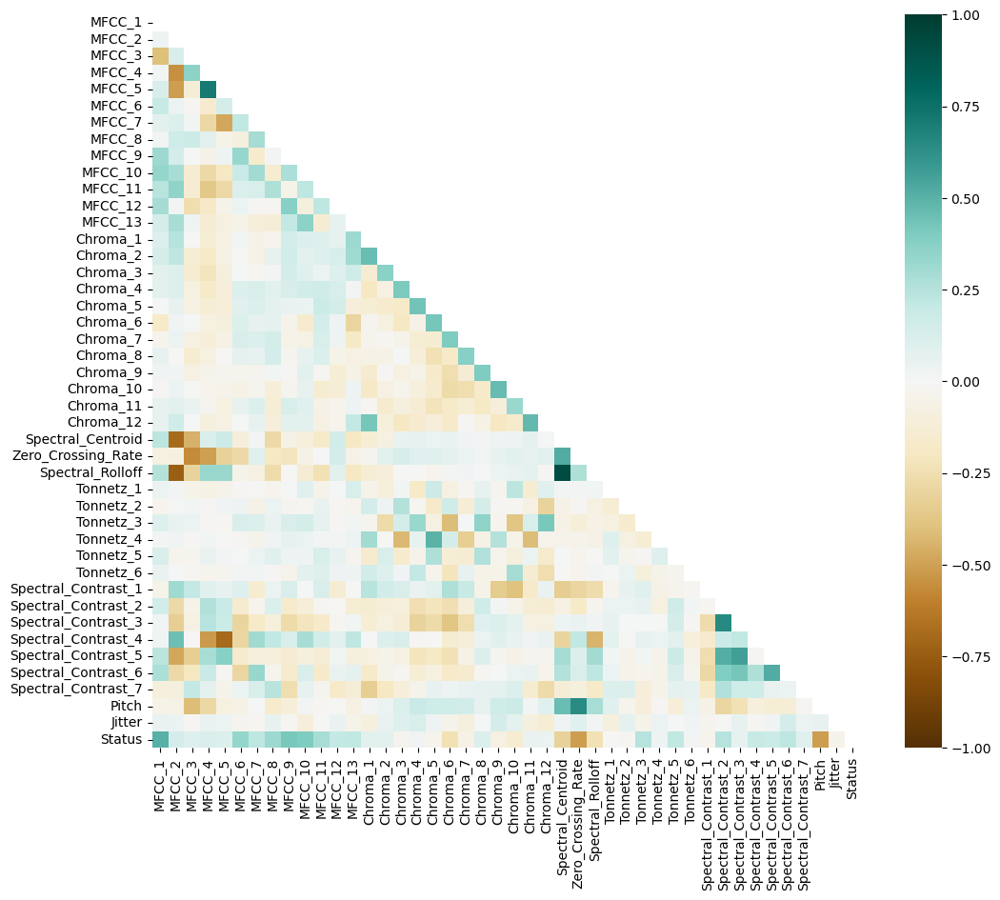

In [36]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Creating the correlation matrix for the DataFrame 'parkinson_dataset'
plt.figure(figsize=(12, 10))
mask = np.triu(np.ones_like(parkinson_dataset.corr(numeric_only=True), dtype=bool))
sns.heatmap(parkinson_dataset.corr(numeric_only=True), vmin=-1, vmax=1, cmap='BrBG', mask=mask)
plt.show()

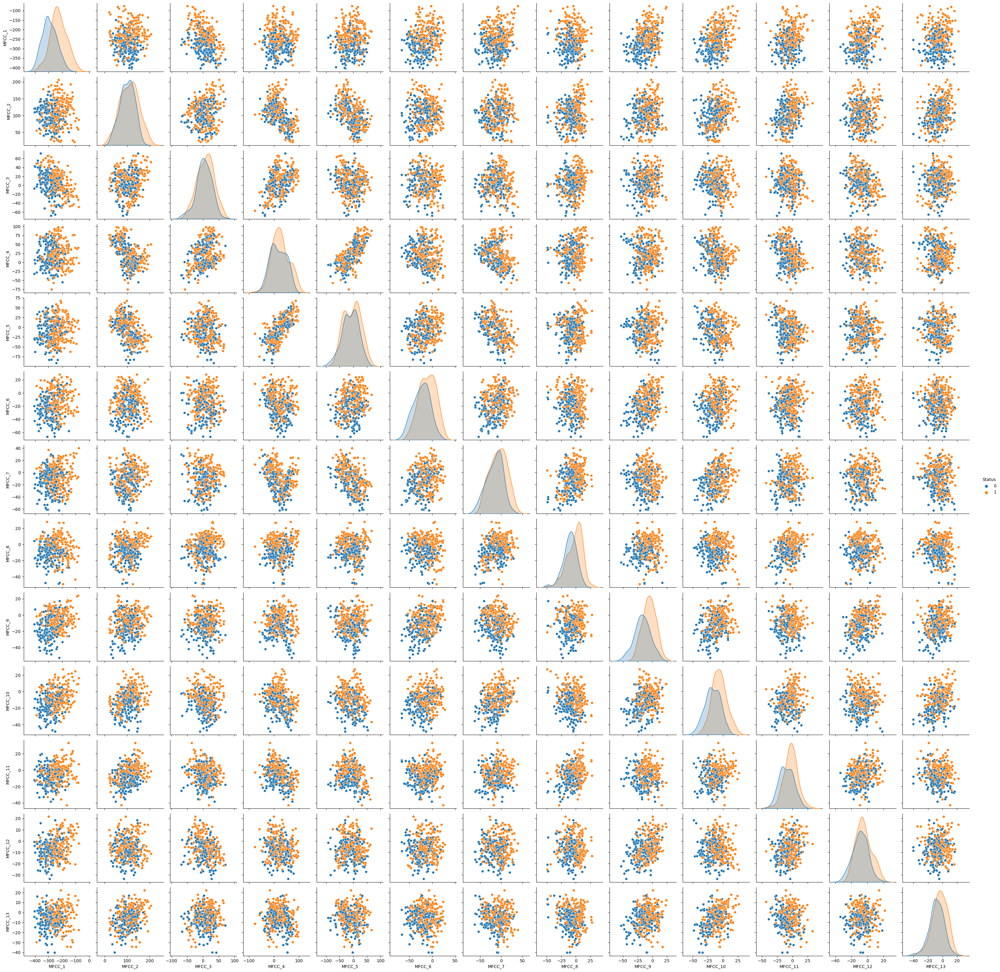

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

# Selecting columns for mean features and 'Status'
mean_columns = [
    'MFCC_1', 'MFCC_2', 'MFCC_3',
    'MFCC_4', 'MFCC_5','MFCC_6',
    'MFCC_7', 'MFCC_8','MFCC_9', 'MFCC_10','MFCC_11','MFCC_12', 'MFCC_13', 'Status'
]

# Creating a DataFrame with the mean features and 'Status'
mean_df = parkinson_dataset[mean_columns]

# Creating pairplot for mean features with Status
sns.pairplot(mean_df, hue='Status')
plt.show()


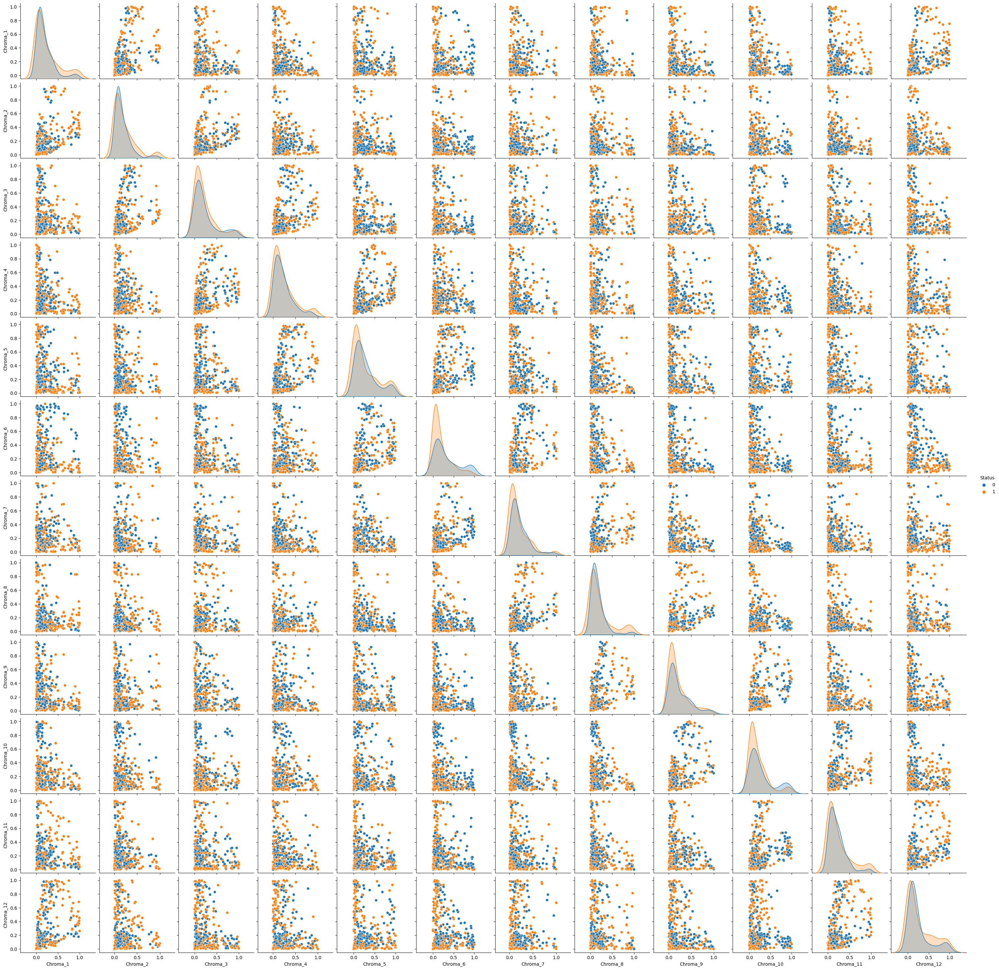

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sélection des colonnes Chroma et 'Status'
chroma_columns = [
    'Chroma_1', 'Chroma_2', 'Chroma_3', 'Chroma_4', 'Chroma_5', 'Chroma_6',
    'Chroma_7', 'Chroma_8', 'Chroma_9', 'Chroma_10', 'Chroma_11', 'Chroma_12',
    'Status'
]

# Création d'un DataFrame avec les caractéristiques Chroma et 'Status'
chroma_df = parkinson_dataset[chroma_columns]

# Création d'un pairplot pour les caractéristiques Chroma avec 'Status'
sns.pairplot(chroma_df, hue='Status')
plt.show()


# Balancing Dataset


In [37]:
# Exploring Imabalance In Dataset
parkinson_dataset['Status'].value_counts()

1    211
0    170
Name: Status, dtype: int64

In [38]:
# Extracting Features Into Features & Target
X = parkinson_dataset.drop(['Status'], axis=1)
y = parkinson_dataset['Status']

print('Feature (X) Shape Before Balancing :', X.shape)
print('Target (y) Shape Before Balancing :', y.shape)



Feature (X) Shape Before Balancing : (381, 43)
Target (y) Shape Before Balancing : (381,)


In [39]:
from sklearn.model_selection import train_test_split

# Diviser les données en ensembles d'entraînement et de test en utilisant stratify
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=20 )


# Model Building

In [40]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import zscore

# Importing metrics used for evaluation of our models
from sklearn import metrics
from sklearn.metrics import classification_report
# Cross Validation
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# Importing library to split the data into training part and testing part.
from sklearn.model_selection import train_test_split

# Importing library to process the data (Normalize the data)
from sklearn.preprocessing import MinMaxScaler, StandardScaler
# Importing necessary libraries used for data cleaning, and data visualization
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


# Ignoring ununnecessary warnings
import warnings
warnings.filterwarnings("ignore")

# Chi Square
from sklearn.feature_selection import chi2
import scipy.stats as stats

# RandomOverSampler to handle imbalanced data
from imblearn.over_sampling import RandomOverSampler

# Constant feature checking
from sklearn.feature_selection import VarianceThreshold

# ANN Model

In [41]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import regularizers
from sklearn.preprocessing import StandardScaler

# Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create the ANN model
model = Sequential()

# Input layer and first hidden layer with L2 regularization
model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001), input_shape=(X_train_scaled.shape[1],)))
model.add(Dropout(0.3))  # Dropout layer to prevent overfitting

# Second hidden layer with L2 regularization
model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.3))

# Output layer
model.add(Dense(1, activation='sigmoid'))  # For binary classification

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_data=(X_test_scaled, y_test), verbose=1)






Epoch 1/50


10/10 [==============================] - 4s 57ms/step - loss: 0.8415 - accuracy: 0.5921 - val_loss: 0.7272 - val_accuracy: 0.6494
Epoch 2/50
10/10 [==============================] - 0s 10ms/step - loss: 0.6830 - accuracy: 0.7401 - val_loss: 0.5882 - val_accuracy: 0.8831
Epoch 3/50
10/10 [==============================] - 0s 12ms/step - loss: 0.5685 - accuracy: 0.8586 - val_loss: 0.4843 - val_accuracy: 0.9221
Epoch 4/50
10/10 [==============================] - 0s 11ms/step - loss: 0.4630 - accuracy: 0.9211 - val_loss: 0.4059 - val_accuracy: 0.9351
Epoch 5/50
10/10 [==============================] - 0s 10ms/step - loss: 0.3951 - accuracy: 0.9243 - val_loss: 0.3478 - val_accuracy: 0.9481
Epoch 6/50
10/10 [==============================] - 0s 10ms/step - loss: 0.3321 - accuracy: 0.9507 - val_loss: 0.3089 - val_accuracy: 0.9351
Epoch 7/50
10/10 [==============================] - 0s 9ms/step - loss: 0.2983 - accuracy: 0.9572 - val_loss: 0.2824 - val_accuracy: 0.9481
Epoch 8/5

In [42]:
# Train the model
history = model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_data=(X_test_scaled, y_test), verbose=1)
# Get the accuracy values
train_accuracy = history.history['accuracy'][-1]  # Accuracy on the training set
test_accuracy = history.history['val_accuracy'][-1]  # Accuracy on the test set

print(f"Accuracy on Train Set: {train_accuracy}")
print(f"Accuracy on Test Set: {test_accuracy}")

Epoch 1/50
10/10 [==============================] - 0s 17ms/step - loss: 0.0918 - accuracy: 1.0000 - val_loss: 0.1289 - val_accuracy: 0.9870
Epoch 2/50
10/10 [==============================] - 0s 13ms/step - loss: 0.0906 - accuracy: 1.0000 - val_loss: 0.1287 - val_accuracy: 0.9870
Epoch 3/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0896 - accuracy: 1.0000 - val_loss: 0.1272 - val_accuracy: 0.9870
Epoch 4/50
10/10 [==============================] - 0s 11ms/step - loss: 0.0880 - accuracy: 1.0000 - val_loss: 0.1228 - val_accuracy: 0.9870
Epoch 5/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0869 - accuracy: 1.0000 - val_loss: 0.1209 - val_accuracy: 0.9870
Epoch 6/50
10/10 [==============================] - 0s 12ms/step - loss: 0.0870 - accuracy: 1.0000 - val_loss: 0.1202 - val_accuracy: 0.9870
Epoch 7/50
10/10 [==============================] - 0s 10ms/step - loss: 0.0853 - accuracy: 1.0000 - val_loss: 0.1194 - val_accuracy: 0.9870
Epoch 8/50
10

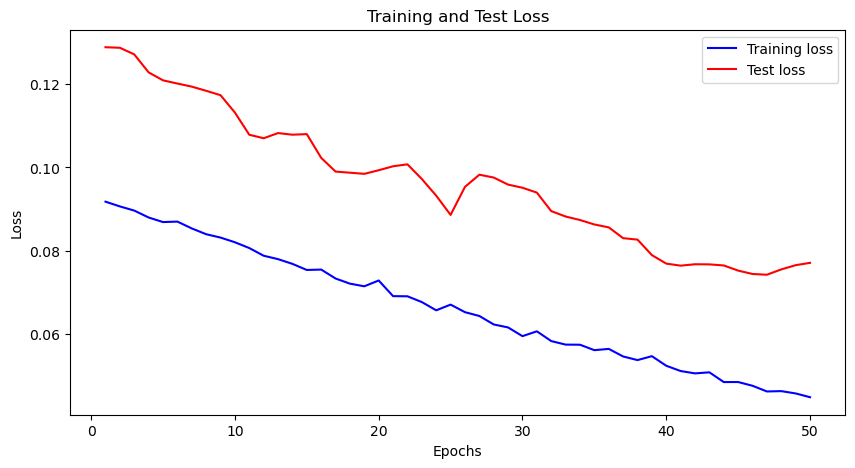

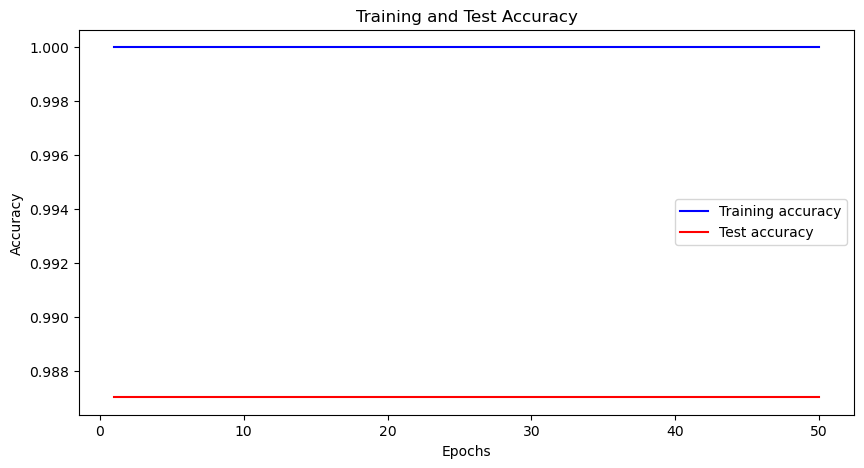

In [43]:
import matplotlib.pyplot as plt

# Récupérer les données de perte et d'exactitude depuis l'historique
train_loss = history.history['loss']
test_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
test_accuracy = history.history['val_accuracy']
epochs = range(1, len(train_loss) + 1)

# Plot Loss
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_loss, 'b', label='Training loss')
plt.plot(epochs, test_loss, 'r', label='Test loss')
plt.title('Training and Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot Accuracy
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_accuracy, 'b', label='Training accuracy')
plt.plot(epochs, test_accuracy, 'r', label='Test accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


3/3 [==============================] - 0s 3ms/step


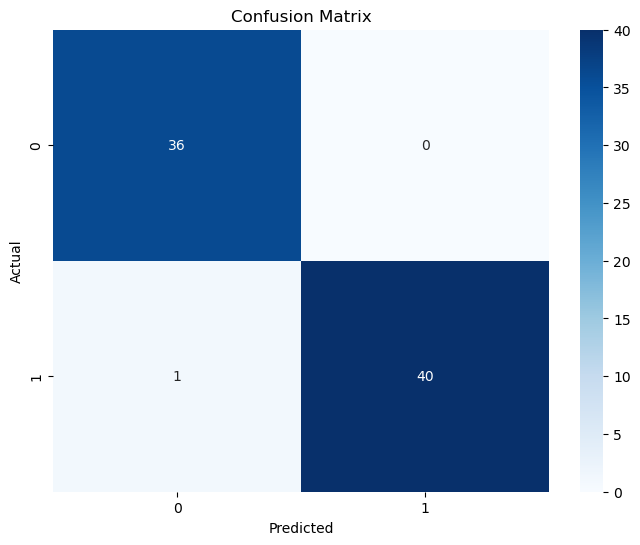

In [46]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Faire des prédictions sur l'ensemble de test
y_pred = model.predict(X_test_scaled)
y_pred_classes = (y_pred > 0.5).astype("int32")  # Transformer les probabilités en classes binaires (0 ou 1)

# Créer la matrice de confusion
conf_matrix = confusion_matrix(y_test, y_pred_classes)

# Visualiser la matrice de confusion
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
